<a href="https://colab.research.google.com/github/vienskaz/ECG-CNN/blob/main/EKG_GANtwoldim50_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import os # accessing directory structure
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from keras.utils import to_categorical
import tensorflow as tf
from tensorflow.keras import layers, models
import seaborn as sns
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense


In [ ]:
mit_test_data = pd.read_csv('/content/drive/MyDrive/ecg/mitbih_test.csv', header=None)
mit_train_data = pd.read_csv('/content/drive/MyDrive/ecg/mitbih_train.csv', header=None)

X_train = mit_train_data.iloc[:, :-1].values
y_train = mit_train_data.iloc[:, -1].values
X_test = mit_test_data.iloc[:, :-1].values
y_test = mit_test_data.iloc[:, -1].values

normal = pd.read_csv('/content/drive/MyDrive/ecg/ptbdb_normal.csv', header=None)
abnormal = pd.read_csv('/content/drive/MyDrive/ecg/ptbdb_abnormal.csv', header=None)
X_normal = normal.iloc[:, :-1].values
y_normal = np.zeros(X_normal.shape[0])
X_abnormal = abnormal.iloc[:, :-1].values
y_abnormal = np.ones(X_abnormal.shape[0])

X = np.concatenate([X_normal, X_abnormal], axis=0)
y = np.concatenate([y_normal, y_abnormal], axis=0)

X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
X = X.reshape((X.shape[0], X.shape[1], 1))

Y_train = to_categorical(y_train)
Y_test = to_categorical(y_test)

In [ ]:
def moving_average_filter(signal, window_size=5):
    filtered=[]
    for data in signal:
      filtered_ecg = np.convolve(data.flatten(), np.ones(window_size) / window_size, mode='same')
      filtered.append(filtered_ecg)
    return np.array(filtered)


In [ ]:
two = []
three = []
four = []
five = []

for i in range(len(Y_train)):
    if np.array_equal(Y_train[i], [0.0, 1.0, 0.0, 0.0, 0.0]):
        two.append(X_train[i])
    elif np.array_equal(Y_train[i], [0.0, 0.0, 1.0, 0.0, 0.0]):
        three.append(X_train[i])
    elif np.array_equal(Y_train[i], [0.0, 0.0, 0.0, 1.0, 0.0]):
        four.append(X_train[i])
    elif np.array_equal(Y_train[i], [0.0, 0.0, 0.0, 0.0, 1.0]):
        five.append(X_train[i])




In [ ]:
np.array(two)
np.array(three)
np.array(four )
np.array(five )

array([[[0.71260995],
        [0.62903225],
        [0.52785921],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       [[1.        ],
        [0.4848485 ],
        [0.54166669],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.58404559],
        [0.5       ],
        [0.42450142],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       ...,

       [[0.90612245],
        [0.62448978],
        [0.59591836],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.85822785],
        [0.64556962],
        [0.84556961],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.90150636],
        [0.84588647],
        [0.80069524],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]]])

In [ ]:
print(len(two))
print(len(three))
print(len(four))
print(len(five))

2223
5788
641
6431


In [ ]:
two = moving_average_filter(two)
three = moving_average_filter(three)
four = moving_average_filter(four)
five = moving_average_filter(five)

In [ ]:
print(two[0].shape)

(187,)


In [ ]:
def build_discriminator(n=187):
    inps = layers.Input(shape=(n,))
    x = Dense(512, activation='relu')(inps)
    x = Dense(512, activation='relu')(x)
    x = Dense(256, activation='relu')(x)
    outs = Dense(1, activation='sigmoid')(x)
    model = models.Model(inps, outs, name='discriminator')
    return model

# Generator definition with the correct activation function


def build_generator(latent_dim=50, output_shape=(187, 1)):
    inps = layers.Input(shape=(latent_dim,))
    x = Dense(256, activation='relu')(inps)
    x = Dense(256, activation='relu')(x)
    outs = Dense(187, activation='tanh')(x)
    model = models.Model(inps, outs, name='generator')
    return model



discriminator = build_discriminator()
generator = build_generator(latent_dim=50)
print(discriminator.summary())
print(generator.summary())

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 187)]             0         
                                                                 
 dense_7 (Dense)             (None, 512)               96256     
                                                                 
 dense_8 (Dense)             (None, 512)               262656    
                                                                 
 dense_9 (Dense)             (None, 256)               131328    
                                                                 
 dense_10 (Dense)            (None, 1)                 257       
                                                                 
Total params: 490497 (1.87 MB)
Trainable params: 490497 (1.87 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
Model: "gene

In [ ]:
class GAN(keras.Model):

    def __init__(self, disc, gen, latent_dim=50):
        super(GAN, self).__init__()
        self.discriminator = disc
        self.generator = gen
        self.latent_dim = latent_dim

    def compile(self, optD, optG, loss_fn):
        super(GAN, self).compile()
        self.optD = optD
        self.optG = optG
        self.loss_fn = loss_fn

    def train_step(self, real_data):
        if isinstance(real_data, tuple):
            real_data = real_data[0]

        bs = tf.shape(real_data)[0]
        z = tf.random.normal(shape=(bs, self.latent_dim))
        fake_data = self.generator(z)

        combined_data = tf.concat([real_data, fake_data], axis=0)
        labels = tf.concat([tf.ones((bs, 1)), tf.zeros((bs, 1))], axis=0)

        with tf.GradientTape() as tape:
            preds = self.discriminator(combined_data)
            d_loss = self.loss_fn(labels, preds)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.optD.apply_gradients(zip(grads, self.discriminator.trainable_weights))

        misleading_labels = tf.ones((bs, 1))
        z = tf.random.normal(shape=(bs, self.latent_dim))

        with tf.GradientTape() as tape:
            fake_preds = self.discriminator(self.generator(z))
            g_loss = self.loss_fn(misleading_labels, fake_preds)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.optG.apply_gradients(zip(grads, self.generator.trainable_weights))

        return {"d_loss": d_loss, "g_loss": g_loss}

gan = GAN(discriminator, generator)

gan.compile(
    optD=keras.optimizers.Adam(learning_rate=0.0001),
    optG=keras.optimizers.Adam(learning_rate=0.001),
    loss_fn=keras.losses.BinaryCrossentropy(),
)


In [ ]:
def show_samples(epoch, generator, data, n=187, l_dim=50):
  generated_points_list=[]
  if epoch % 100 == 0:
    z = tf.random.normal(shape=(n, l_dim))
    generated_data = generator(z)
    generated_points_list.append(generated_data)
    plt.plot(generated_data)
    plt.show()


Epoch 1/2700
69/70 [============================>.] - ETA: 0s - d_loss: 0.4681 - g_loss: 1.4360

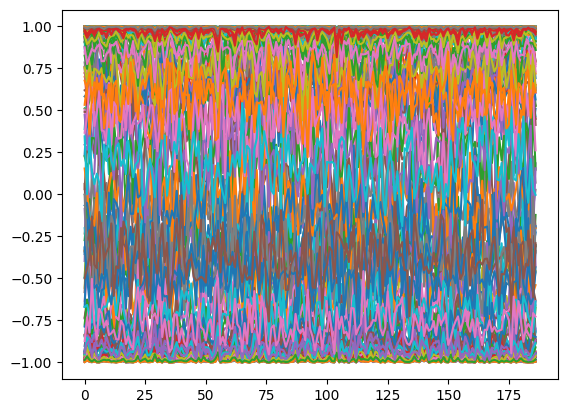

70/70 [==============================] - 3s 24ms/step - d_loss: 0.4640 - g_loss: 1.4655
Epoch 2/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.1708 - g_loss: 3.4383
Epoch 3/2700
70/70 [==============================] - 1s 14ms/step - d_loss: 0.1437 - g_loss: 4.4949
Epoch 4/2700
70/70 [==============================] - 1s 14ms/step - d_loss: 0.2369 - g_loss: 4.9988
Epoch 5/2700
70/70 [==============================] - 1s 14ms/step - d_loss: 0.4182 - g_loss: 3.1215
Epoch 6/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.4803 - g_loss: 2.1995
Epoch 7/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.6683 - g_loss: 0.7420
Epoch 8/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.5822 - g_loss: 0.7053
Epoch 9/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.5735 - g_loss: 1.1445
Epoch 10/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.6709 - g_loss: 1.0931
Ep

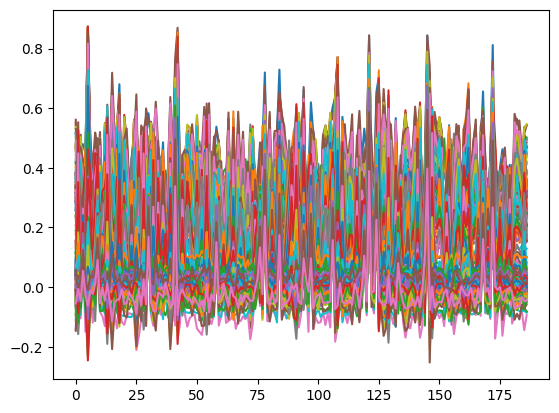

70/70 [==============================] - 2s 33ms/step - d_loss: 0.4708 - g_loss: 1.2232
Epoch 102/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.4849 - g_loss: 1.3527
Epoch 103/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.4168 - g_loss: 1.5530
Epoch 104/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.5588 - g_loss: 1.3126
Epoch 105/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.4457 - g_loss: 1.2678
Epoch 106/2700
70/70 [==============================] - 1s 17ms/step - d_loss: 0.4951 - g_loss: 1.3013
Epoch 107/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.5011 - g_loss: 1.1396
Epoch 108/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.5076 - g_loss: 1.0985
Epoch 109/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.5479 - g_loss: 1.0910
Epoch 110/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.5212 - 

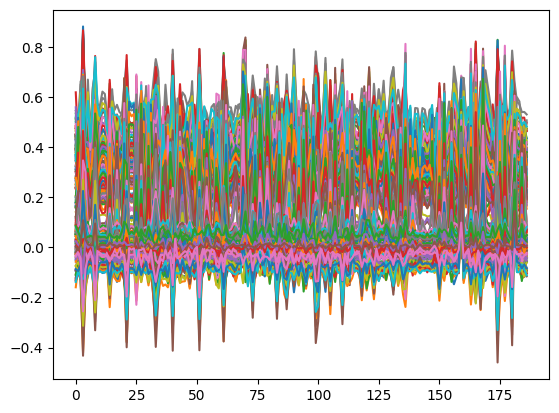

70/70 [==============================] - 2s 32ms/step - d_loss: 0.3066 - g_loss: 2.4979
Epoch 202/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.4618 - g_loss: 1.6946
Epoch 203/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.4156 - g_loss: 1.6921
Epoch 204/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.3386 - g_loss: 1.6858
Epoch 205/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.3864 - g_loss: 2.0177
Epoch 206/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.2579 - g_loss: 2.0075
Epoch 207/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.3975 - g_loss: 2.4250
Epoch 208/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.4029 - g_loss: 1.4634
Epoch 209/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.4056 - g_loss: 1.5809
Epoch 210/2700
70/70 [==============================] - 1s 17ms/step - d_loss: 0.2662 - 

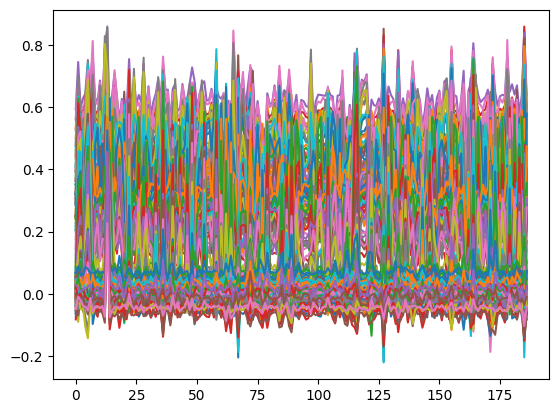

70/70 [==============================] - 2s 25ms/step - d_loss: 0.3302 - g_loss: 1.7340
Epoch 302/2700
70/70 [==============================] - 1s 17ms/step - d_loss: 0.3578 - g_loss: 2.4742
Epoch 303/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.2512 - g_loss: 2.3363
Epoch 304/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.4074 - g_loss: 2.4363
Epoch 305/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.3737 - g_loss: 1.4781
Epoch 306/2700
70/70 [==============================] - 1s 15ms/step - d_loss: 0.4022 - g_loss: 1.6012
Epoch 307/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.3423 - g_loss: 1.7989
Epoch 308/2700
70/70 [==============================] - 1s 17ms/step - d_loss: 0.3990 - g_loss: 2.0878
Epoch 309/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.4073 - g_loss: 1.6353
Epoch 310/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.3873 - 

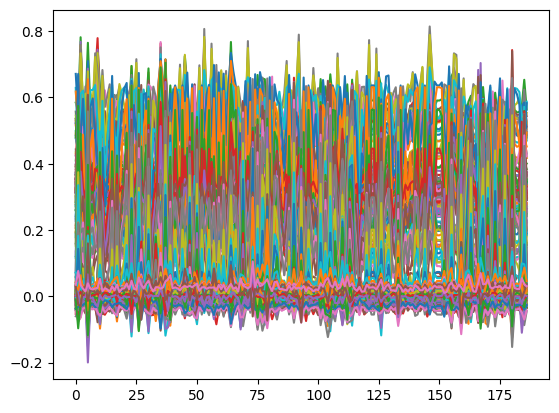

70/70 [==============================] - 2s 26ms/step - d_loss: 0.2769 - g_loss: 2.2378
Epoch 402/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.4131 - g_loss: 2.1248
Epoch 403/2700
70/70 [==============================] - 1s 17ms/step - d_loss: 0.3709 - g_loss: 1.5456
Epoch 404/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.3822 - g_loss: 1.5687
Epoch 405/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.3621 - g_loss: 1.7260
Epoch 406/2700
70/70 [==============================] - 1s 16ms/step - d_loss: 0.3123 - g_loss: 2.1482
Epoch 407/2700
70/70 [==============================] - 1s 18ms/step - d_loss: 0.1752 - g_loss: 2.6147
Epoch 408/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.4051 - g_loss: 2.1972
Epoch 409/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3711 - g_loss: 1.8558
Epoch 410/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3887 - 

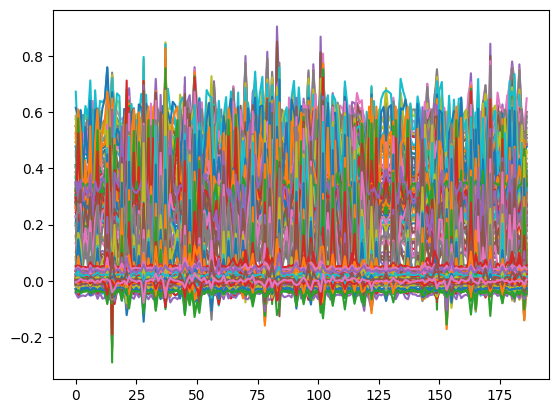

70/70 [==============================] - 2s 32ms/step - d_loss: 0.3221 - g_loss: 2.0174
Epoch 502/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3096 - g_loss: 2.2369
Epoch 503/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2736 - g_loss: 2.2452
Epoch 504/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2504 - g_loss: 2.8640
Epoch 505/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2397 - g_loss: 2.3634
Epoch 506/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.3183 - g_loss: 2.1207
Epoch 507/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.2664 - g_loss: 2.2573
Epoch 508/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 0.2208 - g_loss: 2.8070
Epoch 509/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 0.2444 - g_loss: 3.1557
Epoch 510/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.2280 - 

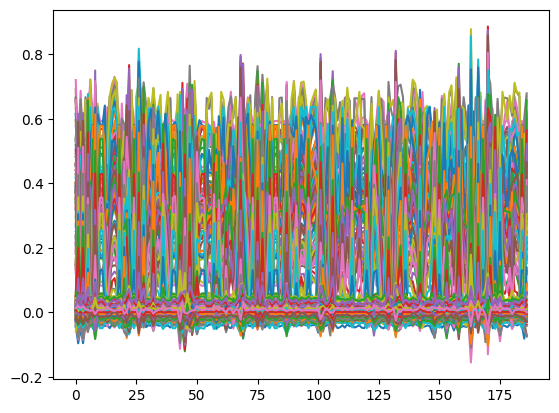

70/70 [==============================] - 2s 28ms/step - d_loss: 0.3853 - g_loss: 1.8543
Epoch 602/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.3408 - g_loss: 1.6614
Epoch 603/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.2874 - g_loss: 2.2406
Epoch 604/2700
70/70 [==============================] - 1s 18ms/step - d_loss: 0.2869 - g_loss: 2.5902
Epoch 605/2700
70/70 [==============================] - 1s 18ms/step - d_loss: 0.1278 - g_loss: 3.0695
Epoch 606/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3256 - g_loss: 3.1125
Epoch 607/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.2605 - g_loss: 2.0618
Epoch 608/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.1832 - g_loss: 2.5594
Epoch 609/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.2320 - g_loss: 3.2915
Epoch 610/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.2349 - 

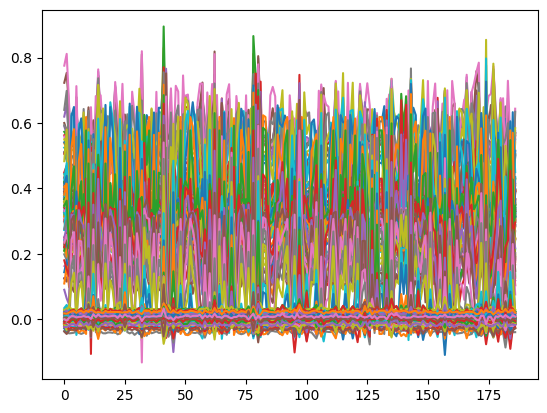

70/70 [==============================] - 2s 34ms/step - d_loss: 0.3790 - g_loss: 1.5202
Epoch 702/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3773 - g_loss: 1.4806
Epoch 703/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.4038 - g_loss: 1.4811
Epoch 704/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.3613 - g_loss: 1.6360
Epoch 705/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.3764 - g_loss: 1.4208
Epoch 706/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.4115 - g_loss: 1.4643
Epoch 707/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3994 - g_loss: 1.3644
Epoch 708/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3757 - g_loss: 1.4759
Epoch 709/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3833 - g_loss: 1.6085
Epoch 710/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.3845 - 

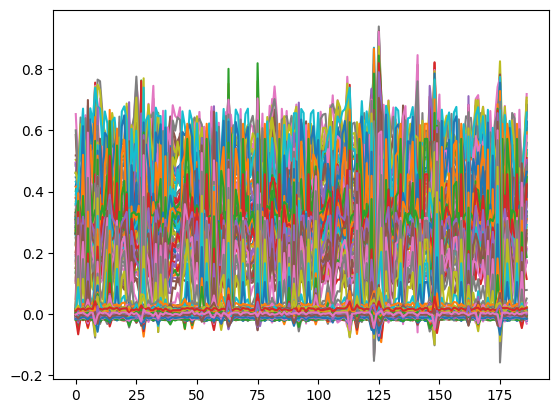

70/70 [==============================] - 3s 39ms/step - d_loss: 0.3569 - g_loss: 1.4806
Epoch 802/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.3809 - g_loss: 1.6030
Epoch 803/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3888 - g_loss: 1.4195
Epoch 804/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3637 - g_loss: 1.7040
Epoch 805/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3525 - g_loss: 1.5448
Epoch 806/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.4063 - g_loss: 1.5190
Epoch 807/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3433 - g_loss: 1.6701
Epoch 808/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3223 - g_loss: 1.7983
Epoch 809/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3638 - g_loss: 1.6260
Epoch 810/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 0.3213 - 

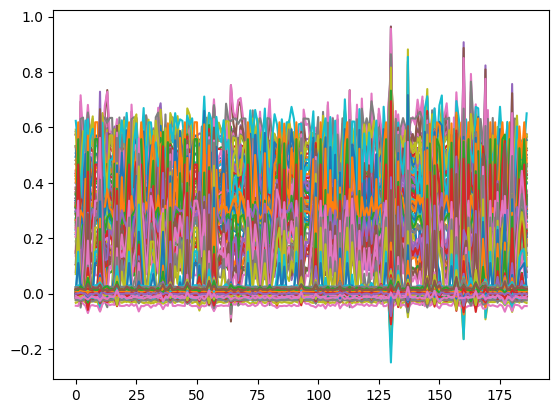

70/70 [==============================] - 3s 36ms/step - d_loss: 0.3766 - g_loss: 1.6341
Epoch 902/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 0.3693 - g_loss: 1.5605
Epoch 903/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3239 - g_loss: 1.8039
Epoch 904/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3705 - g_loss: 1.7878
Epoch 905/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3452 - g_loss: 1.4178
Epoch 906/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3576 - g_loss: 1.8233
Epoch 907/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3388 - g_loss: 1.7080
Epoch 908/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2643 - g_loss: 1.7488
Epoch 909/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3646 - g_loss: 1.9104
Epoch 910/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3812 - 

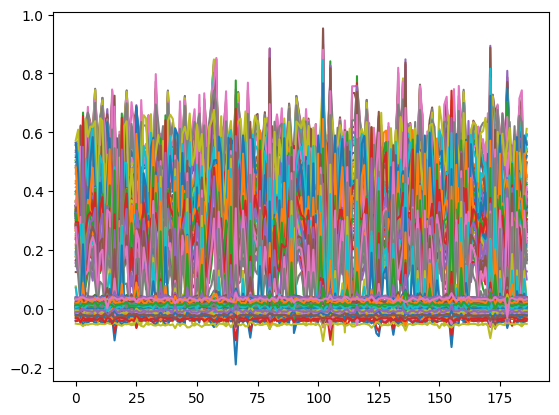

70/70 [==============================] - 3s 37ms/step - d_loss: 0.3439 - g_loss: 1.9404
Epoch 1002/2700
70/70 [==============================] - 2s 27ms/step - d_loss: 0.3163 - g_loss: 1.5998
Epoch 1003/2700
70/70 [==============================] - 2s 28ms/step - d_loss: 0.1908 - g_loss: 2.3559
Epoch 1004/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.4006 - g_loss: 2.1573
Epoch 1005/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3338 - g_loss: 1.5629
Epoch 1006/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.3626 - g_loss: 1.5457
Epoch 1007/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3202 - g_loss: 2.2298
Epoch 1008/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3537 - g_loss: 1.5872
Epoch 1009/2700
70/70 [==============================] - 2s 21ms/step - d_loss: 0.3137 - g_loss: 1.9994
Epoch 1010/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 

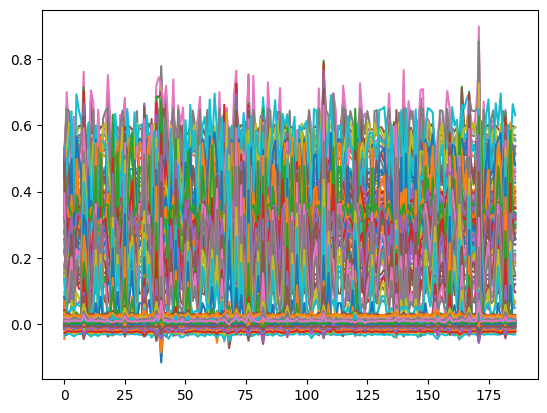

70/70 [==============================] - 3s 41ms/step - d_loss: 0.3843 - g_loss: 1.5594
Epoch 1102/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3792 - g_loss: 1.4719
Epoch 1103/2700
70/70 [==============================] - 2s 21ms/step - d_loss: 0.3196 - g_loss: 1.7342
Epoch 1104/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3885 - g_loss: 1.5905
Epoch 1105/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3175 - g_loss: 1.5513
Epoch 1106/2700
70/70 [==============================] - 2s 21ms/step - d_loss: 0.3597 - g_loss: 1.9910
Epoch 1107/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2923 - g_loss: 2.1798
Epoch 1108/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3131 - g_loss: 2.0081
Epoch 1109/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3148 - g_loss: 1.8560
Epoch 1110/2700
70/70 [==============================] - 2s 27ms/step - d_loss: 

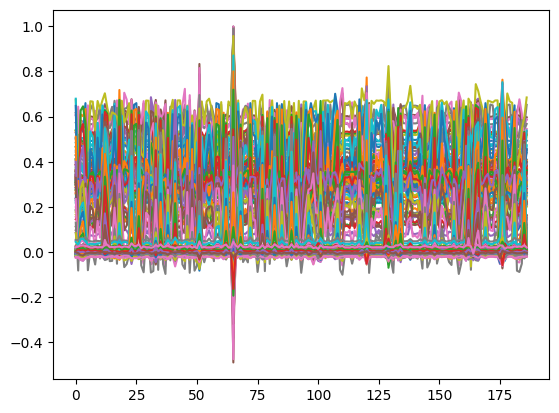

70/70 [==============================] - 2s 34ms/step - d_loss: 0.3776 - g_loss: 1.4833
Epoch 1202/2700
70/70 [==============================] - 2s 21ms/step - d_loss: 0.3698 - g_loss: 1.5657
Epoch 1203/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3261 - g_loss: 1.6648
Epoch 1204/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3477 - g_loss: 1.7561
Epoch 1205/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.3428 - g_loss: 1.5642
Epoch 1206/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3527 - g_loss: 1.8582
Epoch 1207/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.3168 - g_loss: 1.7535
Epoch 1208/2700
70/70 [==============================] - 2s 27ms/step - d_loss: 0.3112 - g_loss: 1.9648
Epoch 1209/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.2981 - g_loss: 1.8628
Epoch 1210/2700
70/70 [==============================] - 2s 28ms/step - d_loss: 

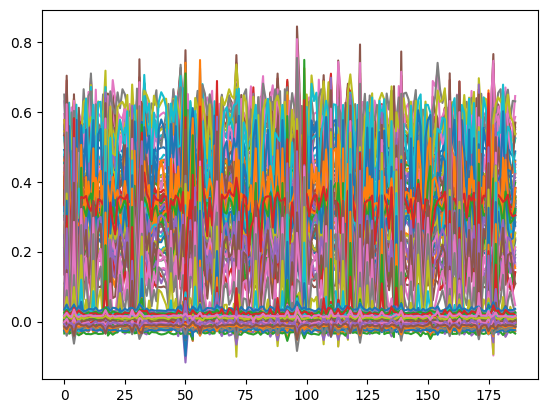

70/70 [==============================] - 3s 43ms/step - d_loss: 0.2746 - g_loss: 2.1680
Epoch 1302/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.2358 - g_loss: 2.1224
Epoch 1303/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.2826 - g_loss: 2.2442
Epoch 1304/2700
70/70 [==============================] - 2s 21ms/step - d_loss: 0.2752 - g_loss: 2.1355
Epoch 1305/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.2425 - g_loss: 2.3034
Epoch 1306/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.2336 - g_loss: 2.1827
Epoch 1307/2700
70/70 [==============================] - 2s 27ms/step - d_loss: 0.3131 - g_loss: 2.0996
Epoch 1308/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.2636 - g_loss: 2.0528
Epoch 1309/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.2757 - g_loss: 2.0239
Epoch 1310/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 

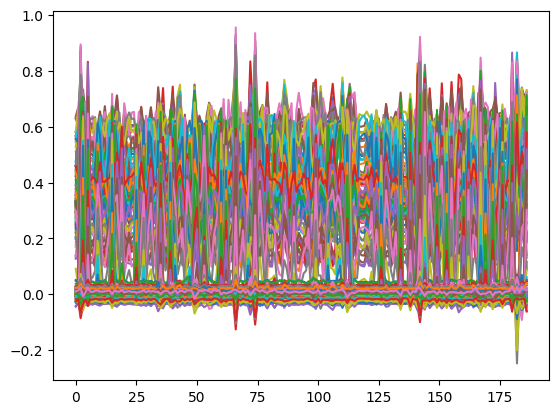

70/70 [==============================] - 3s 43ms/step - d_loss: 0.3099 - g_loss: 2.1810
Epoch 1402/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.2630 - g_loss: 2.3689
Epoch 1403/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3512 - g_loss: 1.6865
Epoch 1404/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2681 - g_loss: 1.8494
Epoch 1405/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3508 - g_loss: 2.0333
Epoch 1406/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3244 - g_loss: 1.6463
Epoch 1407/2700
70/70 [==============================] - 2s 21ms/step - d_loss: 0.3058 - g_loss: 1.7521
Epoch 1408/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2516 - g_loss: 2.3475
Epoch 1409/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3005 - g_loss: 2.3316
Epoch 1410/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 

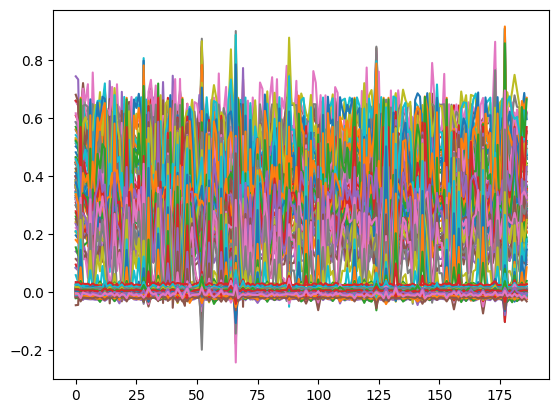

70/70 [==============================] - 2s 36ms/step - d_loss: 0.3780 - g_loss: 1.6076
Epoch 1502/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3588 - g_loss: 1.5954
Epoch 1503/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3749 - g_loss: 1.4680
Epoch 1504/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3779 - g_loss: 1.4036
Epoch 1505/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3622 - g_loss: 1.4262
Epoch 1506/2700
70/70 [==============================] - 2s 21ms/step - d_loss: 0.3721 - g_loss: 1.5714
Epoch 1507/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3580 - g_loss: 1.4630
Epoch 1508/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3512 - g_loss: 1.4528
Epoch 1509/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3633 - g_loss: 1.6641
Epoch 1510/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 

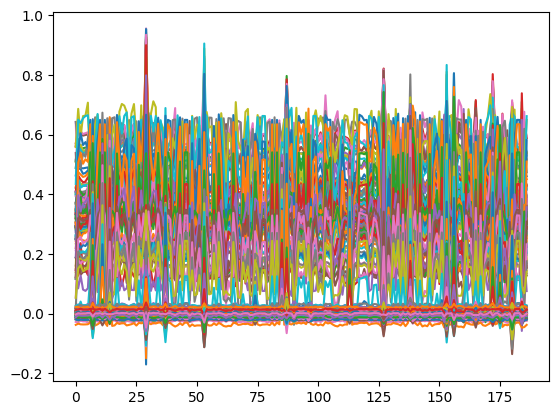

70/70 [==============================] - 2s 35ms/step - d_loss: 0.3142 - g_loss: 1.7180
Epoch 1602/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3436 - g_loss: 1.7332
Epoch 1603/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2933 - g_loss: 1.7944
Epoch 1604/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3337 - g_loss: 1.8986
Epoch 1605/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3489 - g_loss: 1.7158
Epoch 1606/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.3156 - g_loss: 1.8781
Epoch 1607/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 0.2168 - g_loss: 2.1815
Epoch 1608/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.2610 - g_loss: 2.1545
Epoch 1609/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.3634 - g_loss: 1.8543
Epoch 1610/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 

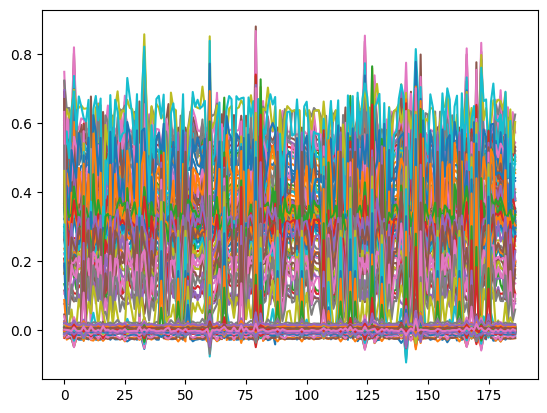

70/70 [==============================] - 2s 33ms/step - d_loss: 0.3684 - g_loss: 1.4863
Epoch 1702/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3519 - g_loss: 1.6427
Epoch 1703/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3379 - g_loss: 1.9067
Epoch 1704/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3475 - g_loss: 1.5582
Epoch 1705/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3231 - g_loss: 1.7150
Epoch 1706/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.2712 - g_loss: 2.2072
Epoch 1707/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.2517 - g_loss: 2.0956
Epoch 1708/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 0.2270 - g_loss: 2.6171
Epoch 1709/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.2537 - g_loss: 2.5120
Epoch 1710/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 

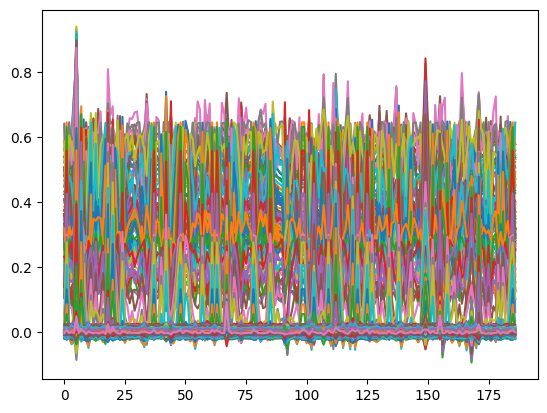

70/70 [==============================] - 2s 35ms/step - d_loss: 0.3209 - g_loss: 1.8140
Epoch 1802/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3522 - g_loss: 1.6497
Epoch 1803/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.3290 - g_loss: 1.7856
Epoch 1804/2700
70/70 [==============================] - 2s 27ms/step - d_loss: 0.3099 - g_loss: 1.7958
Epoch 1805/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3583 - g_loss: 1.7218
Epoch 1806/2700
70/70 [==============================] - 2s 27ms/step - d_loss: 0.3499 - g_loss: 1.6349
Epoch 1807/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.2773 - g_loss: 1.8857
Epoch 1808/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.3296 - g_loss: 1.8446
Epoch 1809/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2282 - g_loss: 2.5582
Epoch 1810/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 

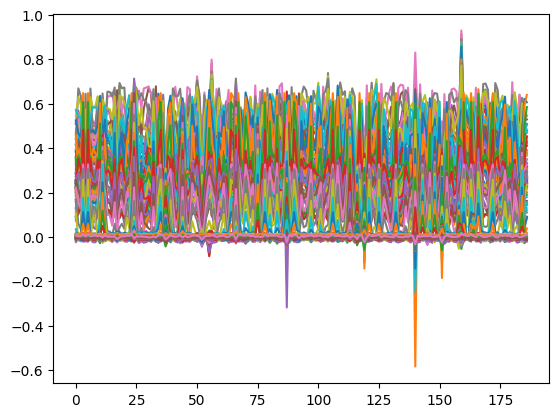

70/70 [==============================] - 3s 36ms/step - d_loss: 0.3452 - g_loss: 1.6065
Epoch 1902/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3672 - g_loss: 1.6901
Epoch 1903/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.3553 - g_loss: 1.4494
Epoch 1904/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3328 - g_loss: 1.7838
Epoch 1905/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3479 - g_loss: 1.6553
Epoch 1906/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3151 - g_loss: 2.0344
Epoch 1907/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2917 - g_loss: 1.6652
Epoch 1908/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3003 - g_loss: 1.9809
Epoch 1909/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2840 - g_loss: 2.0574
Epoch 1910/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 

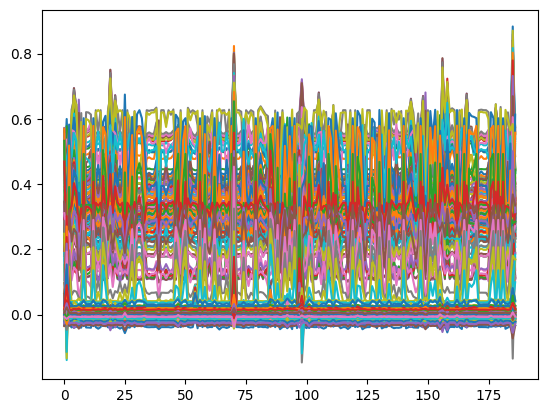

70/70 [==============================] - 2s 33ms/step - d_loss: 0.2419 - g_loss: 2.7109
Epoch 2002/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2764 - g_loss: 2.0075
Epoch 2003/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2203 - g_loss: 2.7485
Epoch 2004/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2338 - g_loss: 2.5669
Epoch 2005/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2884 - g_loss: 2.0157
Epoch 2006/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2199 - g_loss: 2.4426
Epoch 2007/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 0.2060 - g_loss: 2.6284
Epoch 2008/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.1877 - g_loss: 2.9051
Epoch 2009/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.2305 - g_loss: 2.2189
Epoch 2010/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 

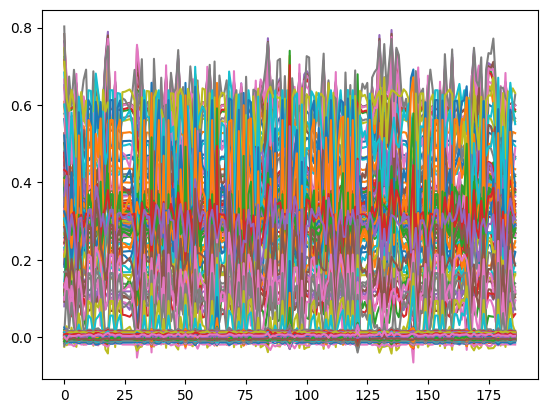

70/70 [==============================] - 2s 32ms/step - d_loss: 0.2415 - g_loss: 2.1274
Epoch 2102/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2581 - g_loss: 2.4441
Epoch 2103/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.2480 - g_loss: 1.9611
Epoch 2104/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.2083 - g_loss: 2.7602
Epoch 2105/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2581 - g_loss: 2.1050
Epoch 2106/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2591 - g_loss: 2.0262
Epoch 2107/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.2651 - g_loss: 2.6602
Epoch 2108/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.2518 - g_loss: 2.0821
Epoch 2109/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.2309 - g_loss: 2.3499
Epoch 2110/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 

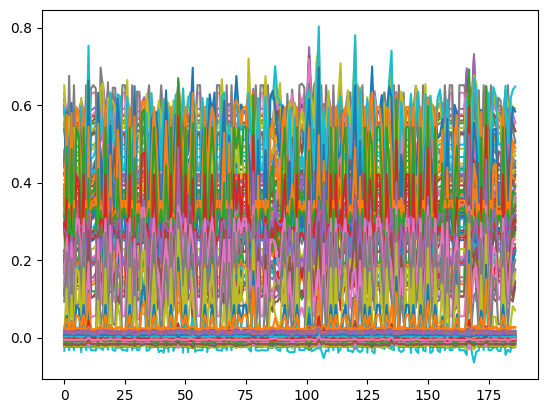

70/70 [==============================] - 2s 35ms/step - d_loss: 0.2311 - g_loss: 2.5075
Epoch 2202/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2532 - g_loss: 2.9105
Epoch 2203/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2918 - g_loss: 2.4358
Epoch 2204/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2645 - g_loss: 1.9432
Epoch 2205/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.2241 - g_loss: 2.6928
Epoch 2206/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2929 - g_loss: 2.3895
Epoch 2207/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.2527 - g_loss: 1.8290
Epoch 2208/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.2418 - g_loss: 2.3154
Epoch 2209/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.1857 - g_loss: 2.9714
Epoch 2210/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 

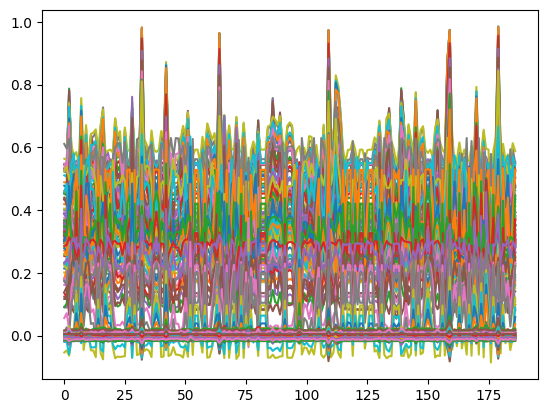

70/70 [==============================] - 3s 41ms/step - d_loss: 0.2833 - g_loss: 1.9338
Epoch 2302/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2417 - g_loss: 2.7808
Epoch 2303/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.1761 - g_loss: 2.9468
Epoch 2304/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.1577 - g_loss: 3.1484
Epoch 2305/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2940 - g_loss: 2.2624
Epoch 2306/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2124 - g_loss: 2.2281
Epoch 2307/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2225 - g_loss: 2.3788
Epoch 2308/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2454 - g_loss: 2.1007
Epoch 2309/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2783 - g_loss: 2.3088
Epoch 2310/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 

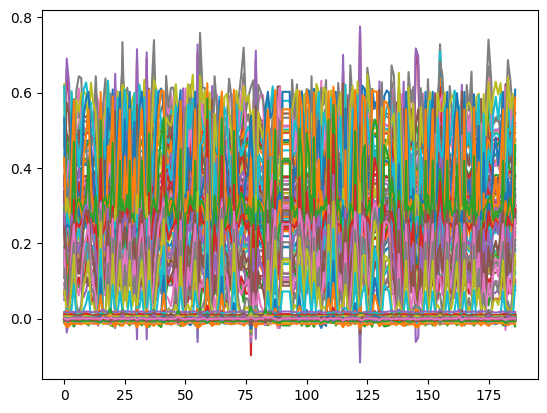

70/70 [==============================] - 2s 35ms/step - d_loss: 0.3156 - g_loss: 1.6551
Epoch 2402/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 0.2847 - g_loss: 1.9092
Epoch 2403/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3302 - g_loss: 1.6902
Epoch 2404/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2752 - g_loss: 2.0217
Epoch 2405/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.3264 - g_loss: 1.7868
Epoch 2406/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.2928 - g_loss: 1.8263
Epoch 2407/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3274 - g_loss: 1.6691
Epoch 2408/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2676 - g_loss: 2.5525
Epoch 2409/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3387 - g_loss: 1.6203
Epoch 2410/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 

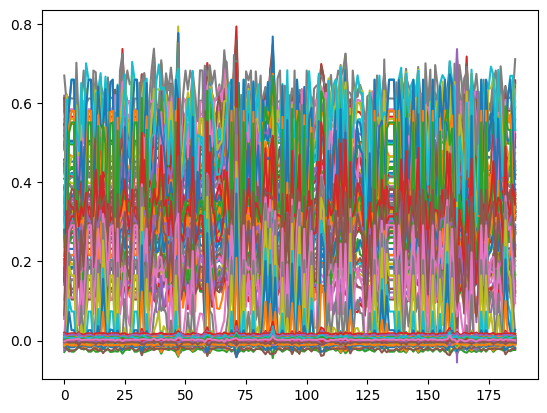

70/70 [==============================] - 2s 33ms/step - d_loss: 0.3155 - g_loss: 1.9410
Epoch 2502/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2847 - g_loss: 1.8233
Epoch 2503/2700
70/70 [==============================] - 1s 19ms/step - d_loss: 0.2692 - g_loss: 1.8470
Epoch 2504/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2968 - g_loss: 2.1173
Epoch 2505/2700
70/70 [==============================] - 2s 21ms/step - d_loss: 0.3188 - g_loss: 1.8029
Epoch 2506/2700
70/70 [==============================] - 2s 25ms/step - d_loss: 0.3264 - g_loss: 1.6526
Epoch 2507/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.2964 - g_loss: 1.7881
Epoch 2508/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.3108 - g_loss: 1.7263
Epoch 2509/2700
70/70 [==============================] - 2s 23ms/step - d_loss: 0.3169 - g_loss: 1.6866
Epoch 2510/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 

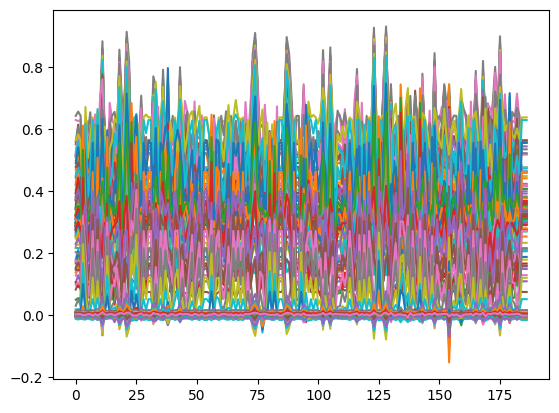

70/70 [==============================] - 2s 33ms/step - d_loss: 0.3002 - g_loss: 2.1923
Epoch 2602/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2964 - g_loss: 1.8697
Epoch 2603/2700
70/70 [==============================] - 1s 20ms/step - d_loss: 0.2435 - g_loss: 2.0754
Epoch 2604/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 0.2955 - g_loss: 2.1178
Epoch 2605/2700
70/70 [==============================] - 2s 22ms/step - d_loss: 0.2946 - g_loss: 1.7725
Epoch 2606/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2928 - g_loss: 1.9056
Epoch 2607/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.2745 - g_loss: 1.9976
Epoch 2608/2700
70/70 [==============================] - 1s 21ms/step - d_loss: 0.3032 - g_loss: 2.3071
Epoch 2609/2700
70/70 [==============================] - 2s 26ms/step - d_loss: 0.3113 - g_loss: 1.6727
Epoch 2610/2700
70/70 [==============================] - 2s 24ms/step - d_loss: 

In [ ]:
cbk = keras.callbacks.LambdaCallback(on_epoch_end=lambda epoch,logs: show_samples(epoch, gan.generator, two))
%time hist = gan.fit(two, epochs=2700, callbacks=[cbk], verbose=True)
gan.save_weights('/content/drive/MyDrive/ecg/architektura3/two2700epok')


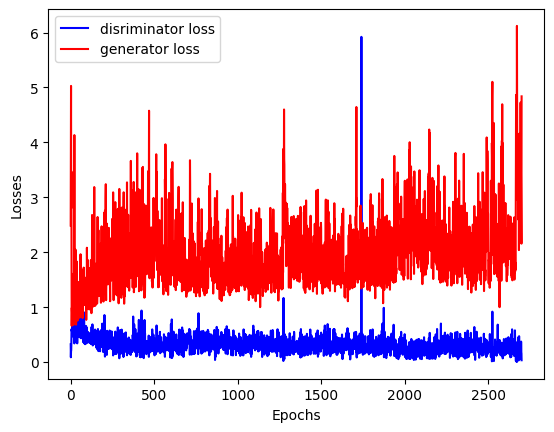

In [ ]:
plt.plot(hist.history['d_loss'], color='blue', label='disriminator loss')
plt.plot(hist.history['g_loss'], color='red', label='generator loss')
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.legend()

WAGI DLA 2

In [ ]:
gan.load_weights('/content/drive/MyDrive/ecg/architektura3/two2700epok')

In [ ]:
def do_data(nums):
    result = []
    latent_dim = 50
    num_samples_to_generate = 1

    for i in range(nums):
        # Generate new set of noise for each iteration
        latent_points = tf.random.normal(shape=(num_samples_to_generate, latent_dim))

        # Use the trained generator to generate data
        generated_data = generator(latent_points)

        # Squeeze the batch dimension, leaving (187, 1)
        generated_data = tf.squeeze(generated_data, axis=0)

        # Convert the TensorFlow tensor to a NumPy array
        generated_data_np = generated_data.numpy()

        # Add the generated data to the result list
        result.append(generated_data_np)

    # Convert the list to a NumPy array
    return np.array(result)

In [ ]:
print(len(two))
print(5000-len(two))

2223
2777


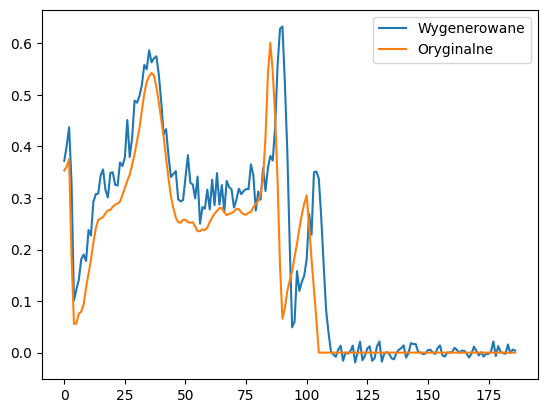

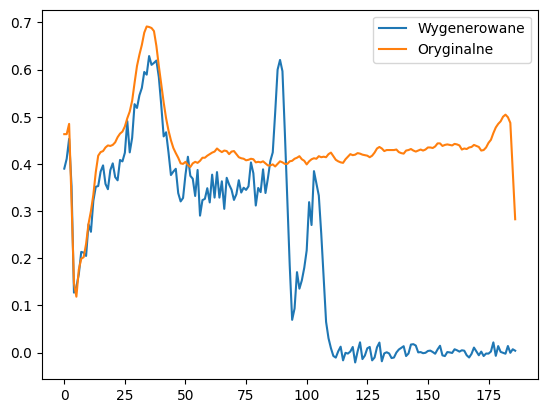

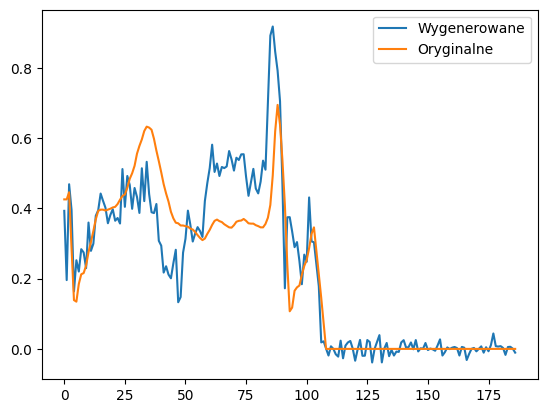

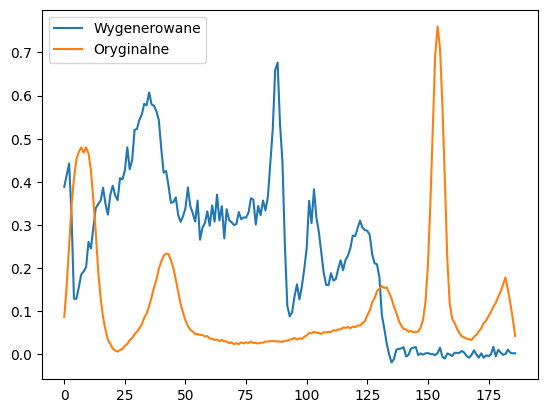

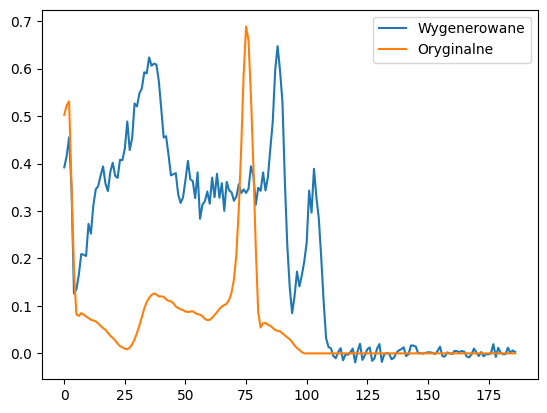

...

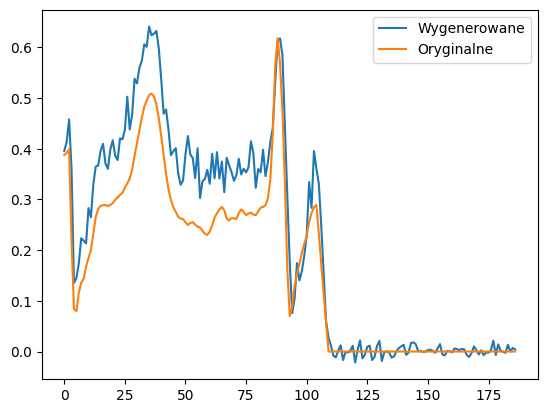

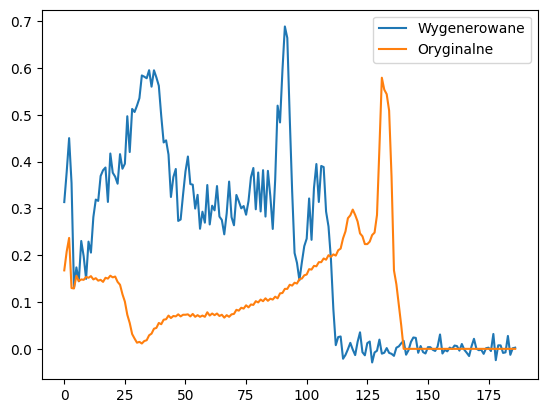

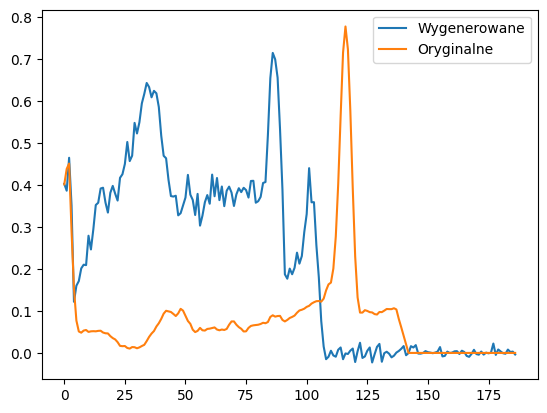

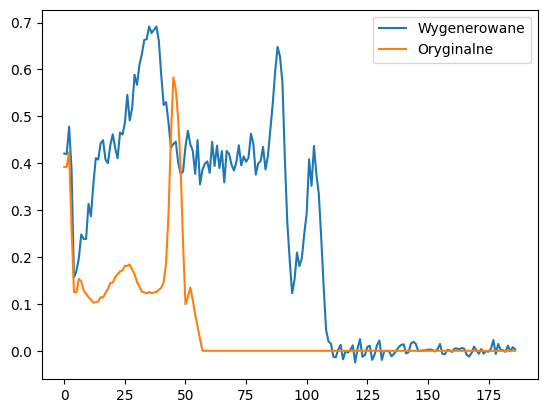

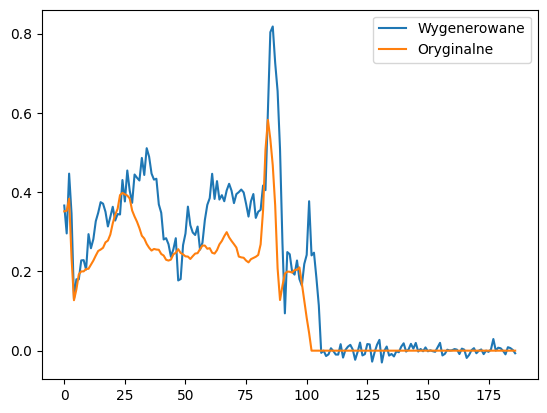

KeyboardInterrupt: ignored

In [ ]:
for i in range(len(twos)):
    plt.figure()
    plt.plot(twos[i], label='Wygenerowane')
    plt.plot(two[i], label='Oryginalne')

    # Dodanie legendy do wykresu
    plt.legend()

    # Wyświetlenie wykresu
    plt.show()

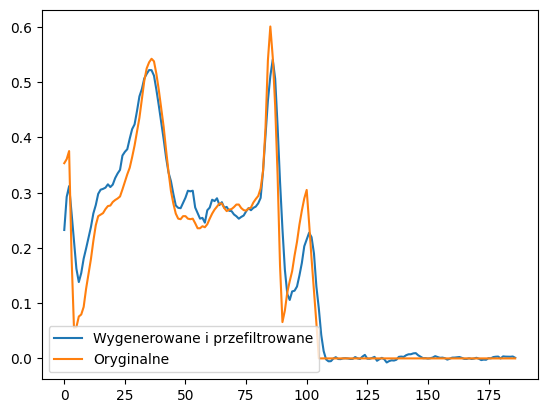

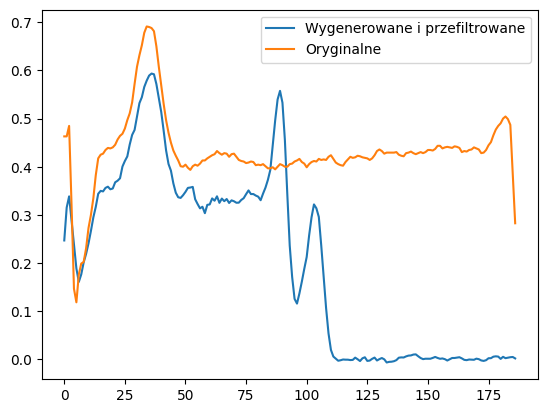

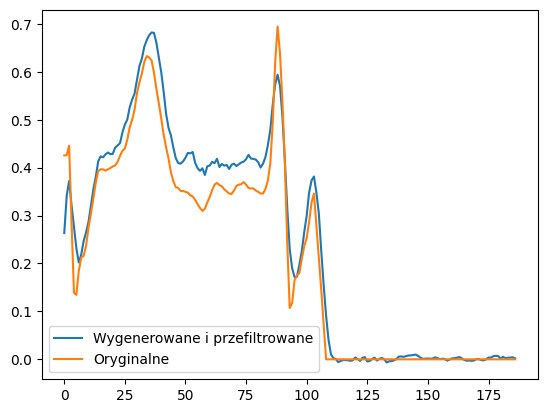

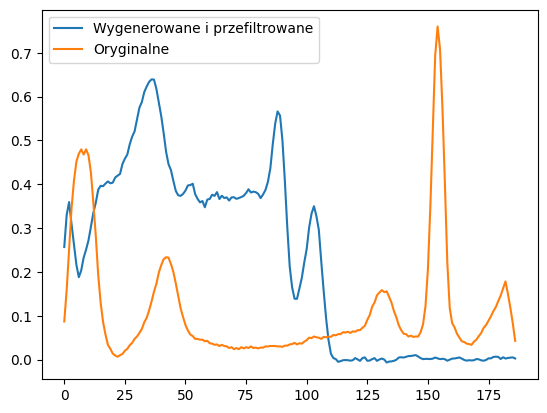

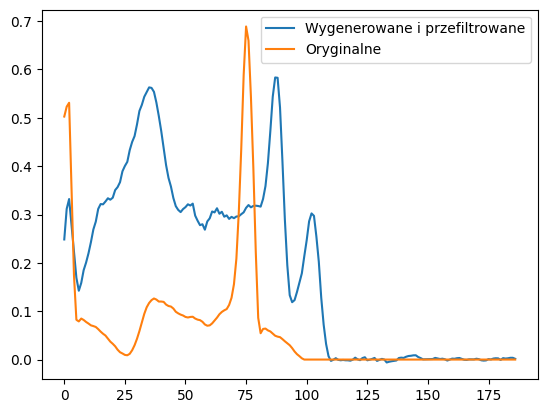

...

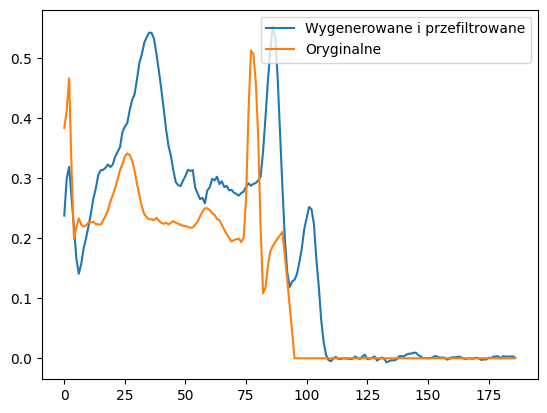

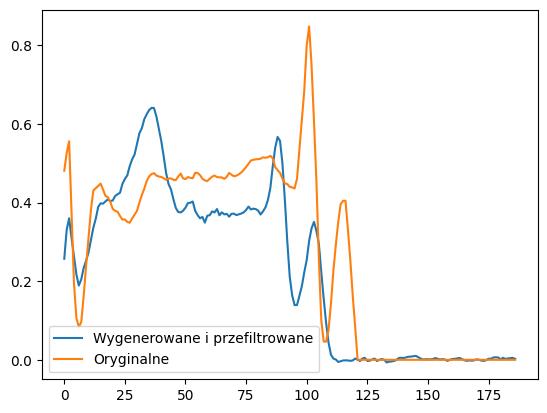

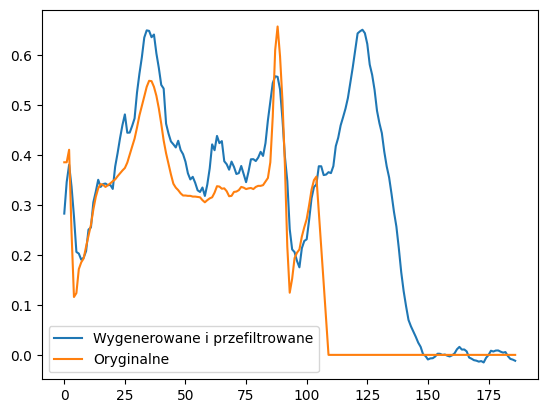

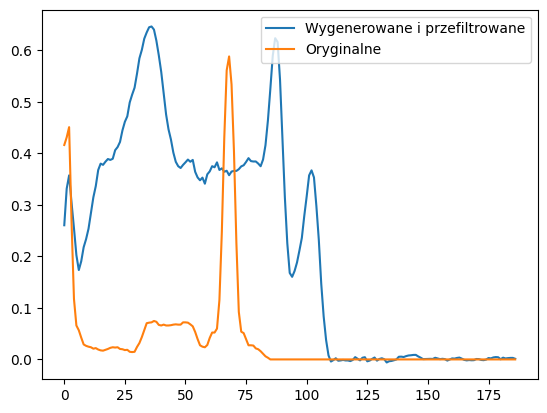

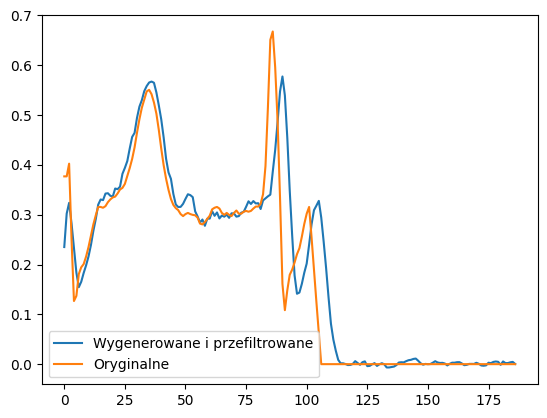

In [ ]:
twos=moving_average_filter(twos)

for i in range(len(twos)):
    plt.figure()
    plt.plot(twos[i], label='Wygenerowane i przefiltrowane')
    plt.plot(two[i], label='Oryginalne')

    # Dodanie legendy do wykresu
    plt.legend()

    # Wyświetlenie wykresu
    plt.show()

In [ ]:
from google.colab import files
twos=do_data(2777)
np.savetxt('twos.csv', twos, delimiter=',')

files.download('twos.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
loaded_array = np.loadtxt('twos.csv', delimiter=',')

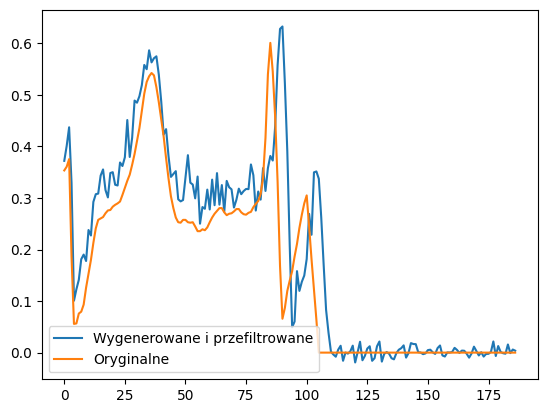

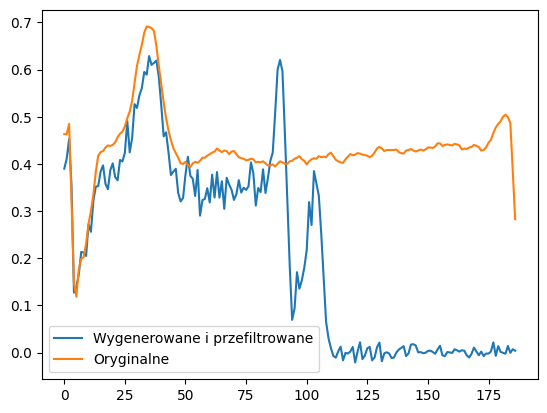

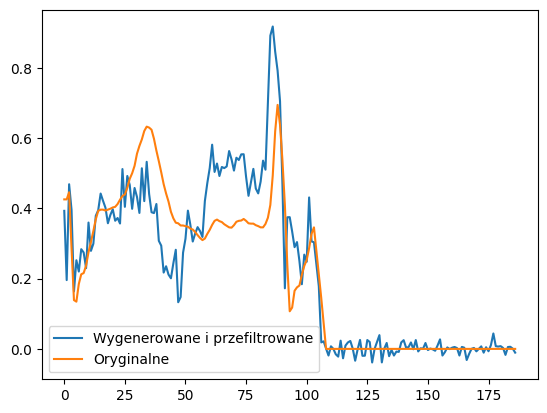

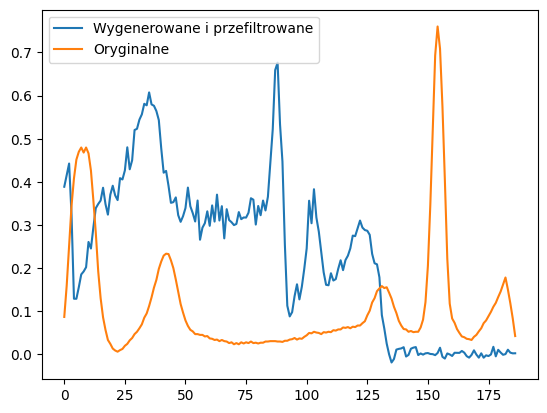

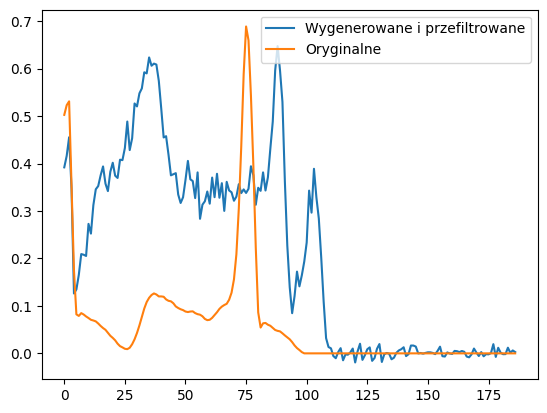

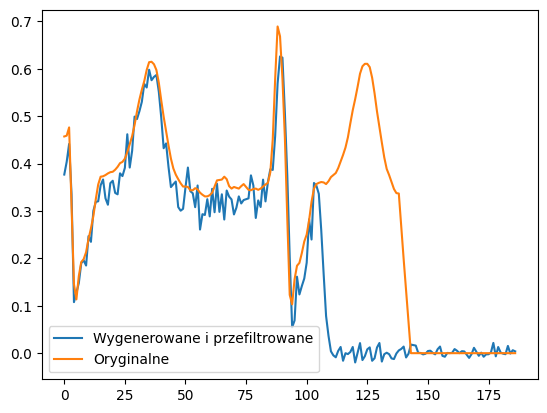

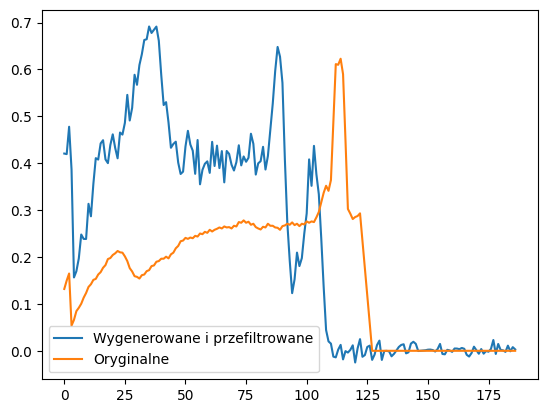

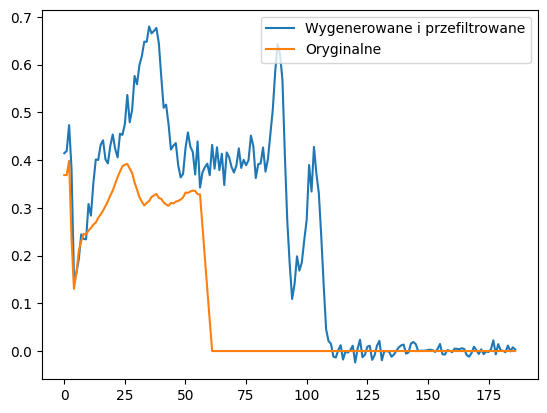

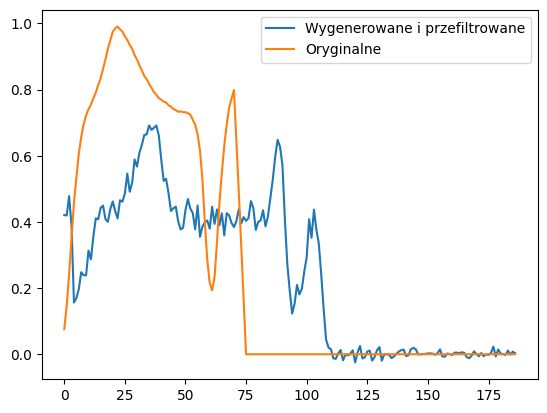

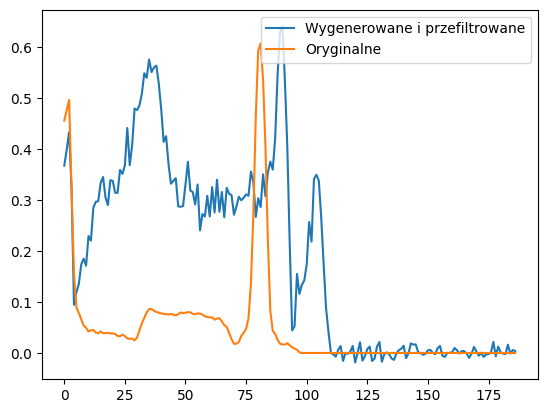

In [ ]:
for i in range(10):
    plt.figure()
    plt.plot(loaded_array[i], label='Wygenerowane i przefiltrowane')
    plt.plot(two[i], label='Oryginalne')

    # Dodanie legendy do wykresu
    plt.legend()

    # Wyświetlenie wykresu
    plt.show()